# COMP-2704: Final Project
# Decision Tree
## Author: Jerome Geronimo (#0397026)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import utils9

## Read the dataset into a Pandas dataframe

In [2]:
# Read the cleaned and resampled dataset to a dataframe
df = pd.read_csv('resampled_data.csv', index_col=0)
df

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Failure Type
0,M14860,M,-0.952389,-0.947360,0.068185,0.282200,-1.695984,No Failure
1,L47181,L,-0.902393,-0.879959,-0.729472,0.633308,-1.648852,No Failure
2,L47182,L,-0.952389,-1.014761,-0.227450,0.944290,-1.617430,No Failure
3,L47183,L,-0.902393,-0.947360,-0.590021,-0.048845,-1.586009,No Failure
4,L47184,L,-0.902393,-0.879959,-0.729472,0.001313,-1.554588,No Failure
...,...,...,...,...,...,...,...,...
57907,M17801,M,0.347507,-0.273351,2.550403,-2.025083,1.493285,Tool Wear Failure
57908,L56354,L,-1.102378,-0.745157,1.853151,-1.443247,1.446152,Tool Wear Failure
57909,M22971,M,0.197519,1.209468,0.079341,-0.690872,1.587549,Tool Wear Failure
57910,L53436,L,0.497496,0.400658,-0.255340,-0.219383,1.540417,Tool Wear Failure


## Removing unnecessary feature/s

Product ID is unique for all entries and does not really tell us anything about the product conditions. This information will only confuse our model and cause it to overfit by memorizing the Product IDs.

In [3]:
# Drop the Product ID column
df.drop(['Product ID'], axis=1, inplace=True)
df

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Failure Type
0,M,-0.952389,-0.947360,0.068185,0.282200,-1.695984,No Failure
1,L,-0.902393,-0.879959,-0.729472,0.633308,-1.648852,No Failure
2,L,-0.952389,-1.014761,-0.227450,0.944290,-1.617430,No Failure
3,L,-0.902393,-0.947360,-0.590021,-0.048845,-1.586009,No Failure
4,L,-0.902393,-0.879959,-0.729472,0.001313,-1.554588,No Failure
...,...,...,...,...,...,...,...
57907,M,0.347507,-0.273351,2.550403,-2.025083,1.493285,Tool Wear Failure
57908,L,-1.102378,-0.745157,1.853151,-1.443247,1.446152,Tool Wear Failure
57909,M,0.197519,1.209468,0.079341,-0.690872,1.587549,Tool Wear Failure
57910,L,0.497496,0.400658,-0.255340,-0.219383,1.540417,Tool Wear Failure


## Some more data cleaning
Since decision tree classifiers cannot handle categorical features, we need to one-hot encode the Type column.

Using Pandas get_dummies function, we've added new Type columns to indicate whether the part is of Low, Medium or High quality.

In [4]:
# Convert categorical variable into indicator variables
type_columns = pd.get_dummies(df['Type'], prefix='Type', dtype=int)
# Create a new dataframe, appending the new type columns
df_one_hot = pd.concat([df, type_columns], axis=1)
# Drop the type column
df_one_hot = df_one_hot.drop('Type', axis=1)
df_one_hot

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Failure Type,Type_H,Type_L,Type_M
0,-0.952389,-0.947360,0.068185,0.282200,-1.695984,No Failure,0,0,1
1,-0.902393,-0.879959,-0.729472,0.633308,-1.648852,No Failure,0,1,0
2,-0.952389,-1.014761,-0.227450,0.944290,-1.617430,No Failure,0,1,0
3,-0.902393,-0.947360,-0.590021,-0.048845,-1.586009,No Failure,0,1,0
4,-0.902393,-0.879959,-0.729472,0.001313,-1.554588,No Failure,0,1,0
...,...,...,...,...,...,...,...,...,...
57907,0.347507,-0.273351,2.550403,-2.025083,1.493285,Tool Wear Failure,0,0,1
57908,-1.102378,-0.745157,1.853151,-1.443247,1.446152,Tool Wear Failure,0,1,0
57909,0.197519,1.209468,0.079341,-0.690872,1.587549,Tool Wear Failure,0,0,1
57910,0.497496,0.400658,-0.255340,-0.219383,1.540417,Tool Wear Failure,0,1,0


## Preparing the training data

For model training using scikit-learn, I have to separate the labels from the features.

The code below separates the features from the labels using Pandas.

In [5]:
X = df_one_hot.drop('Failure Type', axis=1)
y = df_one_hot['Failure Type']
display(X.head(), y.head())

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Type_H,Type_L,Type_M
0,-0.952389,-0.947360,0.068185,0.282200,-1.695984,0,0,1
1,-0.902393,-0.879959,-0.729472,0.633308,-1.648852,0,1,0
2,-0.952389,-1.014761,-0.227450,0.944290,-1.617430,0,1,0
3,-0.902393,-0.947360,-0.590021,-0.048845,-1.586009,0,1,0
4,-0.902393,-0.879959,-0.729472,0.001313,-1.554588,0,1,0


0    No Failure
1    No Failure
2    No Failure
3    No Failure
4    No Failure
Name: Failure Type, dtype: object

## Split the data into training, validation, and testing sets

Since we have 57912 rows in our dataset, it is large enough for an 80-10-10 split.
Training our model using 46,000 data points seems reasonable and shouldn't cause any overfit or underfit.

In [6]:
from sklearn.model_selection import train_test_split

# Allocate 10 percent of my data points to my test dataset
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
# Allocate another 10 percent of my data to my validation dataset
# The rest of my data (80%) will be my training dataset
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=1/9, random_state=42)

print(f'There are {len(X_train)} training data points.')
print(f'There are {len(X_val)} validation data points.')
print(f'There are {len(X_test)} testing data points.')

There are 46328 training data points.
There are 5792 validation data points.
There are 5792 testing data points.


## Training our first Decision Tree classifier using Gini impurity index

For this first model, we want to try training a Decision Tree classifier with unbounded depth, using **Gini impurity index** to measure impurity.

We expect this model to overfit and generate pure leaves.

In [7]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

dt_trial_gini = DecisionTreeClassifier(criterion='gini', random_state=42)
dt_trial_gini.fit(X_train, y_train)
# print(f'The result is a tree of depth {dt_trial_gini.get_depth()} with {dt_trial_gini.get_n_leaves()} leaves.')

DecisionTreeClassifier(random_state=42)

In [8]:
print(f'The result is a tree of depth {dt_trial_gini.get_depth()} with {dt_trial_gini.get_n_leaves()} leaves.')
print(f'Training Accuracy: {dt_trial_gini.score(X_train,y_train)}')
print(f'Validation Accuracy: {dt_trial_gini.score(X_val,y_val)}')

The result is a tree of depth 28 with 253 leaves.
Training Accuracy: 1.0
Validation Accuracy: 0.9979281767955801


The resulting decision tree has a depth of 28 and consists of 253 leaves.  

Despite achieving an impressive accuracy of 99.79%, this model appears to be overfit. A deep tree with pure leaves suggests that the model has essentially memorized the dataset, which could result in poor performance when applied to new data.

In [9]:
utils9.display_tree(dt_trial_gini,feature_names=list(X_train.columns),class_names=dt_trial_gini.classes_)

## Training another Decision Tree classifier using Entropy

This time, we want to try training a Decision Tree classifier with unbounded depth, using **entropy** to measure impurity.

We also expect this model to overfit and generate pure leaves.

In [10]:
dt_trial_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)
dt_trial_entropy.fit(X_train, y_train)
# print(f'The result is a tree of depth {dt_trial_entropy.get_depth()} with {dt_trial_entropy.get_n_leaves()} leaves.')

DecisionTreeClassifier(criterion='entropy', random_state=42)

In [11]:
print(f'The result is a tree of depth {dt_trial_entropy.get_depth()} with {dt_trial_entropy.get_n_leaves()} leaves.')
print(f'Training Accuracy: {dt_trial_entropy.score(X_train,y_train)}')
print(f'Validation Accuracy: {dt_trial_entropy.score(X_val,y_val)}')

The result is a tree of depth 22 with 238 leaves.
Training Accuracy: 1.0
Validation Accuracy: 0.9982734806629834


The result is a tree of depth 22 with 238 leaves.

This model is shallower and has fewer leaves with an even higher accuracy of 99.83%.

But it is still not a very good model and is likely overfit, for the same reasons mentioned above.

In [12]:
utils9.display_tree(dt_trial_entropy,feature_names=list(X_train.columns),class_names=dt_trial_entropy.classes_)

## Using arbitrary values for the classifier's hyperparameters

A DecisionTreeClassifier classifier has several hyperparameters we can use. Some of which are listed here:

| Name        | Description |
| -------------- | ------- |
| **criterion** | The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “log_loss” and “entropy”. |
| **max_depth** | The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples. |
| **max_features** | The number of features to consider when looking for the best split. |
| **min_impurity_decrease** | A node will be split if this split induces a decrease of the impurity greater than or equal to this value. |
| **min_samples_leaf** | The minimum number of samples required to be at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches. |
| **min_samples_split** | The minimum number of samples required to split an internal node |

#### Let's use entropy since it resulted to a shallower tree with fewer leaves.
criterion = 'entropy'

####  Let's use a max_depth of 12 which is half of the average depth of the two trees above.
max_depth = 12

#### Technically, we only have 6 features in this dataset, since Type is encoded into 3 different columns. So we won't change the value for this hyperparameter.
max_features = n_features

#### Let's use 0.005 to make sure that a split must lead to a decrease in impurity
min_impurity_decrease = 0.005

<!-- min_samples_leaf = 100
min_samples_split = 500 -->

In [13]:
dt_arb = DecisionTreeClassifier(criterion='entropy', random_state=42,
                                 max_depth = 12,
                                 min_impurity_decrease = 0.01)
dt_arb.fit(X_train, y_train)
# print(f'The result is a tree of depth {dt_arb.get_depth()} with {dt_arb.get_n_leaves()} leaves.')

DecisionTreeClassifier(criterion='entropy', max_depth=12,
                       min_impurity_decrease=0.01, random_state=42)

In [14]:
print(f'The result is a tree of depth {dt_arb.get_depth()} with {dt_arb.get_n_leaves()} leaves.')
print(f'Training Accuracy: {dt_arb.score(X_train,y_train)}')
print(f'Validation Accuracy: {dt_arb.score(X_val,y_val)}')

The result is a tree of depth 10 with 35 leaves.
Training Accuracy: 0.9238041788982905
Validation Accuracy: 0.9214433701657458


The resulting tree has a depth of 10 and has 35 leaves with an accuracy of 92.14%.

This looks like a good model for now.

## Using Grid-search

One way to pick the best combination of hyperparameters is to run an exhaustive search and choose the one that performs best in our validation set.
A Grid-search is used to find the optimal hyperparameters of a model which results in the most ‘accurate’ predictions.

Let's try performing a grid-search using the following choices for our hyperparameters.

In [15]:
criterion = ['gini', 'entropy']
max_depth = [5, 10, 15, 20]
min_impurity_decrease = [0.05, 0.1, 0.25, 0.5]
min_samples_leaf = [50, 100, 250, 500]
min_samples_split = [100, 250, 500, 1000]

params = {'criterion': criterion, 
          'max_depth': max_depth,
          'min_impurity_decrease': min_impurity_decrease,
          'min_samples_leaf': min_samples_leaf,
          'min_samples_split': min_samples_split}
params

{'criterion': ['gini', 'entropy'],
 'max_depth': [5, 10, 15, 20],
 'min_impurity_decrease': [0.05, 0.1, 0.25, 0.5],
 'min_samples_leaf': [50, 100, 250, 500],
 'min_samples_split': [100, 250, 500, 1000]}

The code below goes through all of the combinations of the hyperparameters above, trains a decision tree classifier and records its accuracy.

In [16]:
list_dt_gs = {
    'model': [],
    'accuracy': [],
    'criterion': [],
    'max_depth': [],
    'min_impurity_decrease': [],
    'min_samples_leaf': [],
    'min_samples_split': []
}

for c in criterion:
    for md in max_depth:
        for mid in min_impurity_decrease:
            for msl in min_samples_leaf:
                for mss in min_samples_split:
                    dt = DecisionTreeClassifier(random_state=42,
                                                criterion=c,
                                                max_depth=md,
                                                min_impurity_decrease=mid,
                                                min_samples_leaf=msl,
                                                min_samples_split=mss)
                    dt.fit(X_train, y_train)
                    list_dt_gs['model'].append(dt)
                    list_dt_gs['accuracy'].append(dt.score(X_val,y_val))
                    list_dt_gs['criterion'].append(c)
                    list_dt_gs['max_depth'].append(md)
                    list_dt_gs['min_impurity_decrease'].append(mid)
                    list_dt_gs['min_samples_leaf'].append(msl)
                    list_dt_gs['min_samples_split'].append(mss)

### Using Pandas to find the combination of hyperparameters that gives the highest accuracy

First, we create a Pandas dataframe to store the training and accuracy data generated above.

In [17]:
df_metrics = pd.DataFrame(list_dt_gs)
df_metrics.head()

,model,accuracy,criterion,max_depth,min_impurity_decrease,min_samples_leaf,min_samples_split
0,"DecisionTreeClassifier(max_depth=5, min_impuri...",0.69078,gini,5,0.05,50,100
1,"DecisionTreeClassifier(max_depth=5, min_impuri...",0.69078,gini,5,0.05,50,250
2,"DecisionTreeClassifier(max_depth=5, min_impuri...",0.69078,gini,5,0.05,50,500
3,"DecisionTreeClassifier(max_depth=5, min_impuri...",0.69078,gini,5,0.05,50,1000
4,"DecisionTreeClassifier(max_depth=5, min_impuri...",0.69078,gini,5,0.05,100,100


Next, we plot the model number vs the accuracy.

Based on the plot below, it looks like the highest accuracy we have is around 0.75.

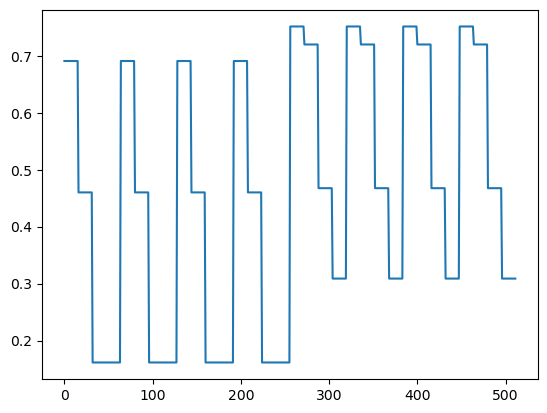

In [18]:
plt.plot(df_metrics.index, df_metrics['accuracy'])

Using Pandas, let's display the rows with accuracies >= 0.75

Let's pick one of these models and use it for our models comparison at the end of this notebook.

In [19]:
display(df_metrics[df_metrics['accuracy']>=0.75])

,model,accuracy,criterion,max_depth,min_impurity_decrease,min_samples_leaf,min_samples_split
256,"DecisionTreeClassifier(criterion='entropy', ma...",0.751381,entropy,5,0.05,50,100
257,"DecisionTreeClassifier(criterion='entropy', ma...",0.751381,entropy,5,0.05,50,250
258,"DecisionTreeClassifier(criterion='entropy', ma...",0.751381,entropy,5,0.05,50,500
259,"DecisionTreeClassifier(criterion='entropy', ma...",0.751381,entropy,5,0.05,50,1000
260,"DecisionTreeClassifier(criterion='entropy', ma...",0.751381,entropy,5,0.05,100,100
...,...,...,...,...,...,...,...
459,"DecisionTreeClassifier(criterion='entropy', ma...",0.751381,entropy,20,0.05,250,1000
460,"DecisionTreeClassifier(criterion='entropy', ma...",0.751381,entropy,20,0.05,500,100
461,"DecisionTreeClassifier(criterion='entropy', ma...",0.751381,entropy,20,0.05,500,250
462,"DecisionTreeClassifier(criterion='entropy', ma...",0.751381,entropy,20,0.05,500,500


In [20]:
dt_mgs = df_metrics.iloc[256]['model']
dt_mgs

DecisionTreeClassifier(criterion='entropy', max_depth=5,
                       min_impurity_decrease=0.05, min_samples_leaf=50,
                       min_samples_split=100, random_state=42)

In [21]:
print(f'The tree has a depth of {dt_mgs.get_depth()} with {dt_mgs.get_n_leaves()} leaves.')
print(f'Training Accuracy: {dt_mgs.score(X_train,y_train)}')
print(f'Validation Accuracy: {dt_mgs.score(X_val,y_val)}')

The tree has a depth of 4 with 9 leaves.
Training Accuracy: 0.7485969608012433
Validation Accuracy: 0.7513812154696132


## Using Scikit-learn's GridSearchCV class

Next, let's try using GridSearchCV to find the best decision tree classifier

In [22]:
from sklearn.model_selection import GridSearchCV

params_gscv = {'criterion': ['gini', 'entropy'],
               'max_depth': [5, 10, 15, 20],
               'min_impurity_decrease': [0.005, 0.075, 0.01, 0.025],
               'min_samples_leaf': [50, 100, 250, 500],
               'min_samples_split': [100, 250, 500, 1000]}

dt_gs = GridSearchCV(DecisionTreeClassifier(), params_gscv)
dt_gs.fit(X_train, y_train)

dt_gscv = dt_gs.best_estimator_
dt_gscv

DecisionTreeClassifier(criterion='entropy', max_depth=15,
                       min_impurity_decrease=0.005, min_samples_leaf=50,
                       min_samples_split=100)

In [23]:
print(f'The result is a tree of depth {dt_gscv.get_depth()} with {dt_gscv.get_n_leaves()} leaves.')
print(f'Training Accuracy: {dt_gscv.score(X_train,y_train)}')
print(f'Validation Accuracy: {dt_gscv.score(X_val,y_val)}')

The result is a tree of depth 12 with 51 leaves.
Training Accuracy: 0.956160421343464
Validation Accuracy: 0.955110497237569


## Compare metrics

Using Scikit-learn's classification_report and confusion_matrix functions, let's select the best decision tree classifier for this dataset.

### Using classification reports

In [24]:
from sklearn.metrics import classification_report

#### Using the decision tree classifier with arbitrary hyperparameters

##### Training Dataset

In [25]:
dt_arb_pred = dt_arb.predict(X_train)
cr = classification_report(y_train, dt_arb_pred, labels=dt_arb.classes_)
print(cr)

                          precision    recall  f1-score   support

Heat Dissipation Failure       0.93      0.95      0.94      7783
              No Failure       0.97      0.69      0.81      7702
      Overstrain Failure       0.96      0.93      0.94      7682
           Power Failure       0.96      0.97      0.97      7700
         Random Failures       0.84      1.00      0.91      7706
       Tool Wear Failure       0.91      1.00      0.95      7755

                accuracy                           0.92     46328
               macro avg       0.93      0.92      0.92     46328
            weighted avg       0.93      0.92      0.92     46328



##### Validation Dataset

In [26]:
dt_arb_pred = dt_arb.predict(X_val)
cr = classification_report(y_val, dt_arb_pred, labels=dt_arb.classes_)
print(cr)

                          precision    recall  f1-score   support

Heat Dissipation Failure       0.93      0.96      0.94       936
              No Failure       0.98      0.69      0.81       978
      Overstrain Failure       0.96      0.91      0.94       989
           Power Failure       0.95      0.97      0.96       981
         Random Failures       0.84      1.00      0.91       991
       Tool Wear Failure       0.90      1.00      0.95       917

                accuracy                           0.92      5792
               macro avg       0.93      0.92      0.92      5792
            weighted avg       0.93      0.92      0.92      5792



#### Using the decision tree classifier from our Grid-search

##### Training Dataset

In [27]:
dt_mgs_pred = dt_mgs.predict(X_train)
cr = classification_report(y_train, dt_mgs_pred, labels=dt_mgs.classes_)
print(cr)

                          precision    recall  f1-score   support

Heat Dissipation Failure       0.89      0.74      0.81      7783
              No Failure       0.50      0.80      0.62      7702
      Overstrain Failure       0.77      0.97      0.86      7682
           Power Failure       0.94      0.86      0.90      7700
         Random Failures       0.68      0.16      0.26      7706
       Tool Wear Failure       0.82      0.95      0.88      7755

                accuracy                           0.75     46328
               macro avg       0.77      0.75      0.72     46328
            weighted avg       0.77      0.75      0.72     46328



##### Validation Dataset

In [28]:
dt_mgs_pred = dt_mgs.predict(X_val)
cr = classification_report(y_val, dt_mgs_pred, labels=dt_mgs.classes_)
print(cr)

                          precision    recall  f1-score   support

Heat Dissipation Failure       0.89      0.76      0.82       936
              No Failure       0.50      0.80      0.62       978
      Overstrain Failure       0.79      0.97      0.87       989
           Power Failure       0.95      0.87      0.90       981
         Random Failures       0.73      0.17      0.28       991
       Tool Wear Failure       0.81      0.95      0.88       917

                accuracy                           0.75      5792
               macro avg       0.78      0.75      0.73      5792
            weighted avg       0.78      0.75      0.72      5792



#### Using the decision tree classifier from Scikit-learn's Grid-search

##### Training Dataset

In [29]:
dt_gscv_pred = dt_gscv.predict(X_train)
cr = classification_report(y_train, dt_gscv_pred, labels=dt_gscv.classes_)
print(cr)

                          precision    recall  f1-score   support

Heat Dissipation Failure       0.95      0.98      0.97      7783
              No Failure       1.00      0.79      0.88      7702
      Overstrain Failure       0.97      0.97      0.97      7682
           Power Failure       0.99      1.00      0.99      7700
         Random Failures       0.91      1.00      0.95      7706
       Tool Wear Failure       0.94      1.00      0.97      7755

                accuracy                           0.96     46328
               macro avg       0.96      0.96      0.95     46328
            weighted avg       0.96      0.96      0.95     46328



##### Validation Dataset

In [30]:
dt_gscv_pred = dt_gscv.predict(X_val)
cr = classification_report(y_val, dt_gscv_pred, labels=dt_gscv.classes_)
print(cr)

                          precision    recall  f1-score   support

Heat Dissipation Failure       0.95      0.99      0.97       936
              No Failure       1.00      0.79      0.88       978
      Overstrain Failure       0.97      0.96      0.97       989
           Power Failure       0.98      1.00      0.99       981
         Random Failures       0.90      1.00      0.95       991
       Tool Wear Failure       0.94      1.00      0.97       917

                accuracy                           0.96      5792
               macro avg       0.96      0.96      0.95      5792
            weighted avg       0.96      0.96      0.95      5792



### Using confusion matrices

In [31]:
from sklearn.metrics import ConfusionMatrixDisplay

Text(0.5, 1.0, 'DT GridSearchCV (Val)')

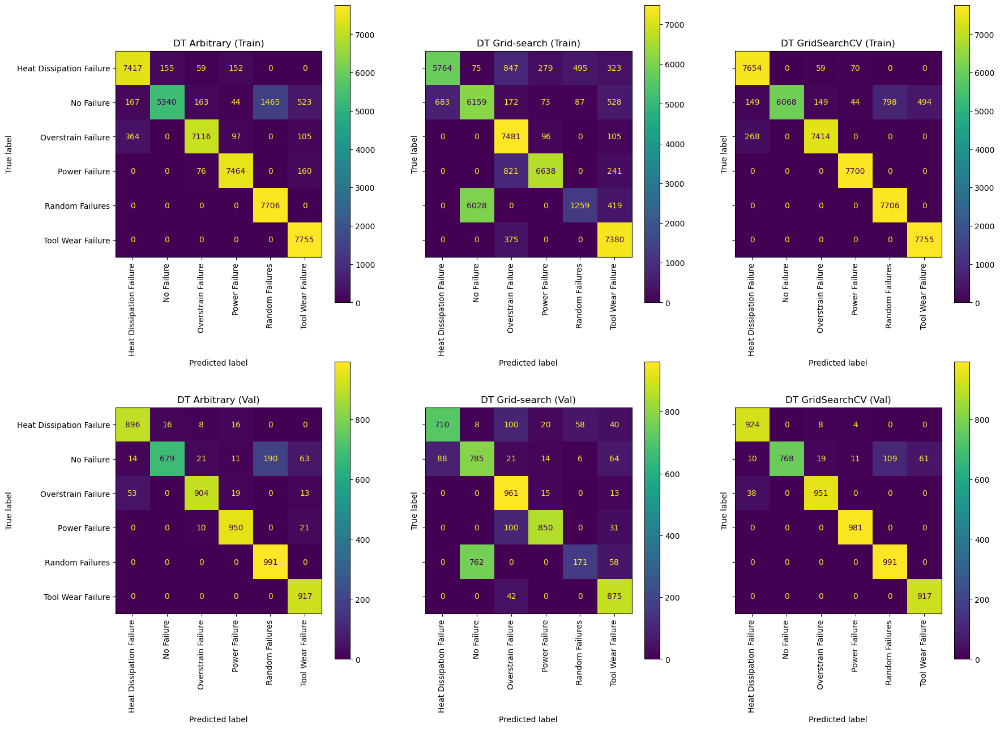

In [32]:
fig, ax = plt.subplots(2,3,figsize=(20,15),sharey='row')

# Using DT with arbitrary parameters
ConfusionMatrixDisplay.from_predictions(y_train,
                                        dt_arb.predict(X_train),
                                        labels=list(dt_arb.classes_),
                                        xticks_rotation='vertical',
                                        ax=ax[0,0])

ConfusionMatrixDisplay.from_predictions(y_val,
                                        dt_arb.predict(X_val),
                                        labels=list(dt_arb.classes_),
                                        xticks_rotation='vertical',
                                        ax=ax[1,0])

# Using DT from Grid-search
ConfusionMatrixDisplay.from_predictions(y_train,
                                        dt_mgs.predict(X_train),
                                        labels=list(dt_mgs.classes_),
                                        xticks_rotation='vertical',
                                        ax=ax[0,1])
ConfusionMatrixDisplay.from_predictions(y_val,
                                        dt_mgs.predict(X_val),
                                        labels=list(dt_mgs.classes_),
                                        xticks_rotation='vertical',
                                        ax=ax[1,1])

# Using DT from Scikit-learn's GridSearchCV
ConfusionMatrixDisplay.from_predictions(y_train,
                                        dt_gscv.predict(X_train),
                                        labels=list(dt_gscv.classes_),
                                        xticks_rotation='vertical',
                                        ax=ax[0,2])
ConfusionMatrixDisplay.from_predictions(y_val,
                                        dt_gscv.predict(X_val),
                                        labels=list(dt_gscv.classes_),
                                        xticks_rotation='vertical',
                                        ax=ax[1,2])

ax[0,0].set_title('DT Arbitrary (Train)')
ax[1,0].set_title('DT Arbitrary (Val)')
ax[0,1].set_title('DT Grid-search (Train)')
ax[1,1].set_title('DT Grid-search (Val)')
ax[0,2].set_title('DT GridSearchCV (Train)')
ax[1,2].set_title('DT GridSearchCV (Val)')

### Using tree plots

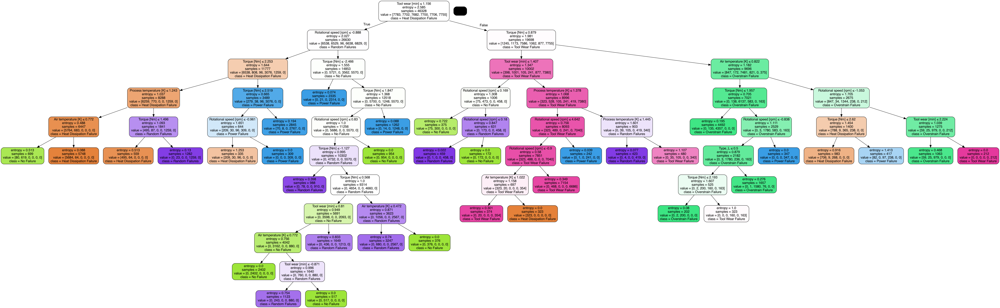

In [33]:
utils9.display_tree(dt_arb,feature_names=list(X_train.columns),class_names=dt_arb.classes_)

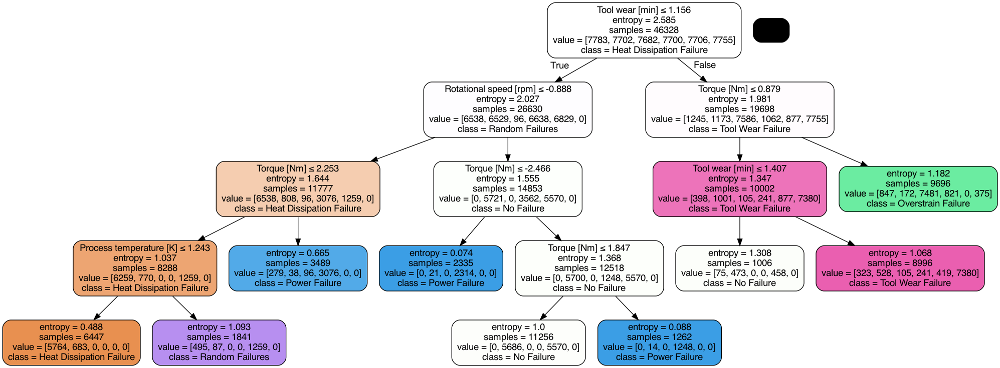

In [34]:
utils9.display_tree(dt_mgs,feature_names=list(X_train.columns),class_names=dt_mgs.classes_)

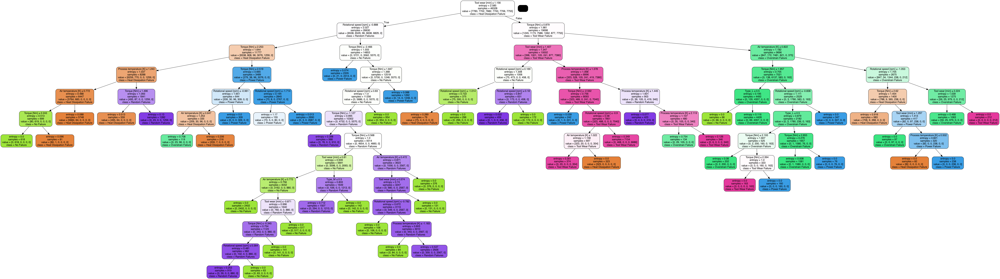

In [35]:
utils9.display_tree(dt_gscv,feature_names=list(X_train.columns),class_names=dt_gscv.classes_)

## Observations and Model Selection

Since we want to minimize the false positives of the 'No Failure' class, we are looking for a model with high precision. Among the three models compared, DT Grid-search has the lowest precision and accuracy, making it unsuitable for our needs.

Between DT Trial and DT GridSearchCV, the latter gave a higher accuracy of 95.51%. However, accuracy alone isn't a reliable indicator of model performance for our use case. We need a model with higher precision for the 'No Failure' class. The classification report above highlights DT GridSearchCV's precision of 1.0 while maintaining high recall (few false negatives) for other classes, making it a a better choice than DT Trial. Furthermore, studying the decision tree plots reveals that DT Trial's leaves have higher entropies compared to DT GridSearchCV, where most leaves have zero entropy.

Considering these observations, we conclude that DT GridSearchCV is the most suitable decision tree classifier for our dataset and use case.

# Comparison

### Decision Tree Metrics

#### Decision Tree Accuracies

The resulting tree has a depth of 12 and 51 leaves.  
Training Accuracy: 0.956160421343464  
Validation Accuracy: 0.955110497237569

#### Decision Tree Classification Report (Val)

|  | precision | recall | f1-score | support |
| -- | -- | -- | -- | -- |
| **Heat Dissipation Failure**    |   0.95    |  0.99   |   0.97    |   936 |
|              **No Failure**     |   1.00    |  0.79   |   0.88    |   978 |
|      **Overstrain Failure**     |   0.97    |  0.96   |   0.97    |   989 |
|           **Power Failure**     |   0.98    |  1.00   |   0.99    |   981 |
|         **Random Failures**     |   0.90    |  1.00   |   0.95    |   991 |
|       **Tool Wear Failure**     |   0.94    |  1.00   |   0.97    |   917 |
|                accuracy     |           |         |  0.96     | 5792 |
|               macro avg     |  0.96     | 0.96    |  0.95     | 5792 |
|            weighted avg     |  0.96     | 0.96    |  0.95     | 5792 |

![DTCM](cf_dt_gscv.png)

### SVM Metrics

#### SVM Accuracies

Degree = 5  
Training Accuracy: 0.9452598860300466  
Validation Accuracy: 0.9449240331491713

#### SVM Classification Report (Val)

|  | precision | recall | f1-score | support |
| -- | -- | -- | -- | -- |
| **Heat Dissipation Failure**    |   0.98   |   1.00   |   0.99   |    936|
|              **No Failure**     |   0.80   |   0.89   |   0.85   |    978|
|      **Overstrain Failure**     |   1.00   |   1.00   |   1.00   |    989|
|           **Power Failure**     |   0.99   |   1.00   |   1.00   |    981|
|         **Random Failures**     |   0.96   |   0.79   |   0.86   |    991|
|       **Tool Wear Failure**     |   0.95   |   1.00   |   0.98   |    917|
|                accuracy     |           |         |  0.94    |  5792|
|               macro avg     |  0.95     | 0.95    |  0.95    |  5792|
|            weighted avg     |  0.95     | 0.94    |  0.94    |  5792|     

![SVMCM](cf_svm_poly_5.png)

Based on the metrics above, it looks like the Decision Tree classifier (DT) has the better performance on the dataset.

First of all, the DT model's training and validation accuracies are higher than the SVM's, although not by a lot (95.5% vs 94.5%). Although, it does have a lower number of True Positives compared to the SVM (768 vs 872), it doesn't have any False Positive errors for the 'No Failure' class (Precision of 1.0).

For these reasons, the Decision Tree classifier is our best model and we will use it to make predictions on our test dataset.

### Testing Data

In [36]:
test_pred = dt_gscv.predict(X_test)

In [37]:
print(f'Validation Accuracy: {dt_gscv.score(X_test,y_test)}')

Validation Accuracy: 0.9549378453038674


In [38]:
cr = classification_report(y_test, test_pred, labels=dt_gscv.classes_)
print(cr)

                          precision    recall  f1-score   support

Heat Dissipation Failure       0.95      0.98      0.97       933
              No Failure       1.00      0.78      0.87       972
      Overstrain Failure       0.97      0.97      0.97       981
           Power Failure       0.99      1.00      0.99       971
         Random Failures       0.91      1.00      0.95       955
       Tool Wear Failure       0.93      1.00      0.96       980

                accuracy                           0.95      5792
               macro avg       0.96      0.96      0.95      5792
            weighted avg       0.96      0.95      0.95      5792



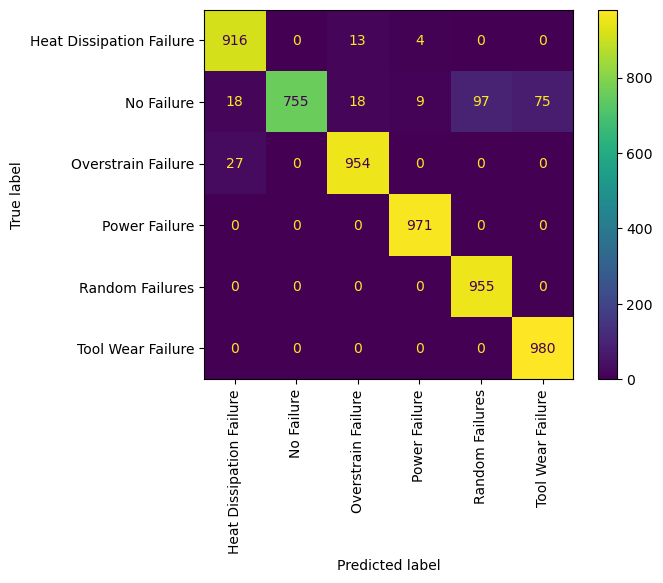

In [39]:
ConfusionMatrixDisplay.from_predictions(y_test,
                                        test_pred,
                                        labels=list(dt_gscv.classes_),
                                        xticks_rotation='vertical')

# Conclusion

After experimenting with different classifiers, we have found the best model for our use case to be a Decision Tree with the ff. parameters:
- criterion='entropy'
- max_depth=15
- min_impurity_decrease=0.005
- min_samples_leaf=50
- min_samples_split=100

Our model has an **accuracy of 95.49%**

Looking at precision and recall, our model has **100% precision** for the 'No Failure' class, and **96% average recall** for all classes. This is perfectly illustrated by the confusion matrix above where we can see that there are no mispredictions/misclassifications of the 'No Failure' class, and small figures for the false predictions on the other classes.

Again, for our automotive parts manufacturing facility, this is the perfect model to use. The model does a good job of identifying failures based on the parameters it's fed, and will avoid labeling products as operational when it has actually failed. Thus, ensuring maximum operational efficiency for all machinery.